This dataset is taken from Kaggle, and You can download it from this [link](https://www.kaggle.com/competitions/allstate-claims-severity)

# 1. EDA

## 1.x. Data Understanding

In [1]:
%matplotlib inline
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.model_selection import train_test_split
from catboost import CatBoostRegressor
from scipy.sparse import csr_matrix
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from h5py import File
from pickle import dump
sns.set_style('darkgrid')

In [2]:
loss_amount_train = pd.read_csv('datasets/Allstate Claims Severity/train.csv', low_memory=True)
loss_amount_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 188318 entries, 0 to 188317
Columns: 132 entries, id to loss
dtypes: float64(15), int64(1), object(116)
memory usage: 189.7+ MB


In [3]:
loss_amount_test = pd.read_csv('datasets/Allstate Claims Severity/test.csv', low_memory=True)
loss_amount_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 125546 entries, 0 to 125545
Columns: 131 entries, id to cont14
dtypes: float64(14), int64(1), object(116)
memory usage: 125.5+ MB


## 1.xx. Data Integration

In [4]:
loss_amount = pd.concat([loss_amount_train, loss_amount_test], join='outer', axis=0)

## 1.xxx. Data Manipulation

In [5]:
loss_amount.reset_index(drop=True, inplace=True)

## 1.x. Data Understanding

In [6]:
loss_amount.head()

,id,cat1,cat2,cat3,cat4,cat5,cat6,cat7,cat8,cat9,...,cont6,cont7,cont8,cont9,cont10,cont11,cont12,cont13,cont14,loss
0,1,A,B,A,B,A,A,A,A,B,...,0.718367,0.335060,0.30260,0.67135,0.83510,0.569745,0.594646,0.822493,0.714843,2213.18
1,2,A,B,A,A,A,A,A,A,B,...,0.438917,0.436585,0.60087,0.35127,0.43919,0.338312,0.366307,0.611431,0.304496,1283.60
2,5,A,B,A,A,B,A,A,A,B,...,0.289648,0.315545,0.27320,0.26076,0.32446,0.381398,0.373424,0.195709,0.774425,3005.09
3,10,B,B,A,B,A,A,A,A,B,...,0.440945,0.391128,0.31796,0.32128,0.44467,0.327915,0.321570,0.605077,0.602642,939.85
4,11,A,B,A,B,A,A,A,A,B,...,0.178193,0.247408,0.24564,0.22089,0.21230,0.204687,0.202213,0.246011,0.432606,2763.85


In [7]:
loss_amount.isnull().sum().sum()

125546

In [8]:
loss_amount.describe()

,id,cont1,cont2,cont3,cont4,cont5,cont6,cont7,cont8,cont9,cont10,cont11,cont12,cont13,cont14,loss
count,313864.000000,313864.000000,313864.000000,313864.000000,313864.000000,313864.000000,313864.000000,313864.000000,313864.000000,313864.00000,313864.000000,313864.000000,313864.000000,313864.000000,313864.000000,188318.000000
mean,294108.450826,0.494096,0.507089,0.498653,0.492021,0.487513,0.491442,0.485360,0.486823,0.48571,0.498403,0.493850,0.493503,0.493917,0.495665,3037.337686
std,169641.129773,0.187768,0.207056,0.201961,0.211101,0.209063,0.205394,0.178531,0.199442,0.18185,0.185906,0.210002,0.209716,0.212911,0.222537,2904.086186
min,1.000000,0.000016,0.001149,0.002634,0.176921,0.281143,0.012683,0.069503,0.236880,0.00008,0.000000,0.035321,0.036232,0.000228,0.178568,0.670000
25%,147263.750000,0.347403,0.358319,0.336963,0.327354,0.281143,0.336105,0.351299,0.317960,0.35897,0.364580,0.310961,0.314945,0.315758,0.294657,1204.460000
50%,294432.500000,0.475784,0.555782,0.527991,0.452887,0.422268,0.440945,0.438650,0.441060,0.44145,0.461190,0.457203,0.462286,0.363547,0.407020,2115.570000
75%,441176.500000,0.625272,0.681761,0.634224,0.652072,0.643315,0.655818,0.591165,0.623580,0.56889,0.619840,0.678924,0.679096,0.689974,0.724707,3864.045000
max,587634.000000,0.984975,0.862654,0.944251,0.956046,0.983674,0.997162,1.000000,0.982800,0.99540,0.994980,0.998742,0.998484,0.988494,0.844848,121012.250000


## 1.xx. Correlation Analysis

In [9]:
loss_amount_corr = loss_amount.corr(numeric_only=int)
loss_amount_corr

,id,cont1,cont2,cont3,cont4,cont5,cont6,cont7,cont8,cont9,cont10,cont11,cont12,cont13,cont14,loss
id,1.000000,0.001233,0.002477,0.001365,0.000832,-0.001068,0.001513,0.002142,0.004234,0.001012,0.002083,0.001176,0.000989,0.001172,-0.002713,-0.001122
cont1,0.001233,1.000000,-0.083952,-0.445421,0.367405,-0.024688,0.758326,0.367416,0.361388,0.930675,0.808348,0.596406,0.614666,0.533811,0.056945,-0.010237
cont2,0.002477,-0.083952,1.000000,0.455592,0.039860,0.189055,0.016276,0.048294,0.137631,-0.031313,0.063809,0.117304,0.106756,0.022391,-0.046519,0.141528
cont3,0.001365,-0.445421,0.455592,1.000000,-0.342102,0.089966,-0.349864,0.097863,-0.184817,-0.417043,-0.326211,0.024356,0.004944,-0.420499,-0.039961,0.111053
cont4,0.000832,0.367405,0.039860,-0.342102,1.000000,0.162684,0.221849,-0.113945,0.531246,0.329785,0.283009,0.122028,0.131676,0.179797,0.017699,-0.035831
cont5,-0.001068,-0.024688,0.189055,0.089966,0.162684,1.000000,-0.150292,-0.249430,0.009375,-0.087344,-0.066091,-0.150864,-0.147580,-0.083578,-0.022065,-0.011355
cont6,0.001513,0.758326,0.016276,-0.349864,0.221849,-0.150292,1.000000,0.658667,0.438032,0.797387,0.883910,0.774715,0.786202,0.813994,0.041351,0.040967
cont7,0.002142,0.367416,0.048294,0.097863,-0.113945,-0.249430,0.658667,1.000000,0.143452,0.384268,0.492947,0.747605,0.743182,0.286068,0.021427,0.119799
cont8,0.004234,0.361388,0.137631,-0.184817,0.531246,0.009375,0.438032,0.143452,1.000000,0.452110,0.337773,0.304621,0.318134,0.475566,0.044115,0.030508
cont9,0.001012,0.930675,-0.031313,-0.417043,0.329785,-0.087344,0.797387,0.384268,0.452110,1.000000,0.786035,0.608503,0.627238,0.640639,0.074520,0.014456


## 1.xxx. Data Visualization

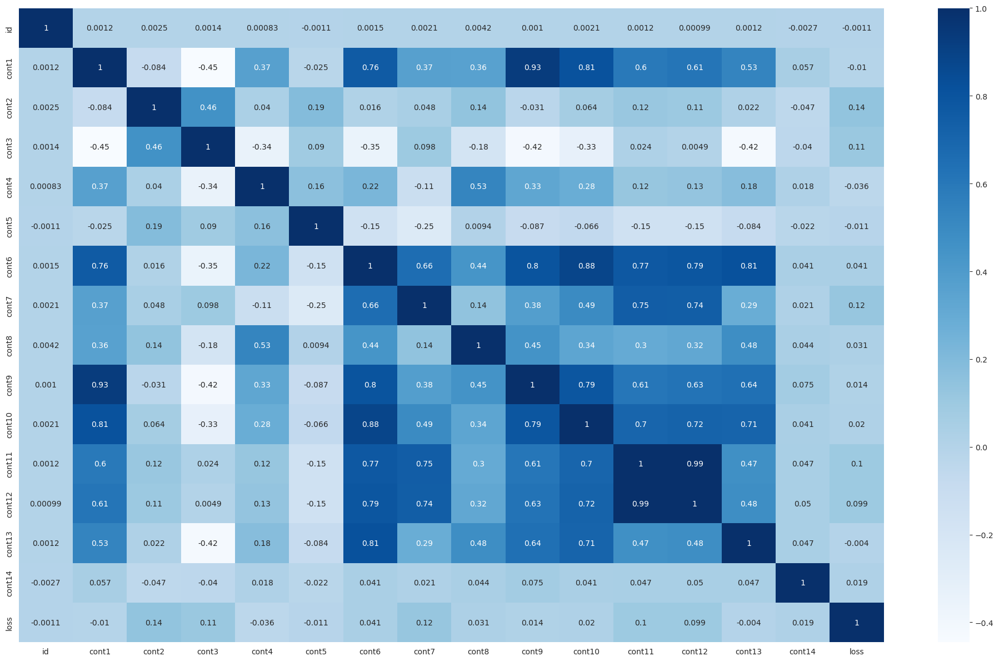

In [10]:
plt.figure(figsize=(20, 12))
heatmap = sns.heatmap(data=loss_amount_corr, annot=True, cmap='Blues')
plt.tight_layout()

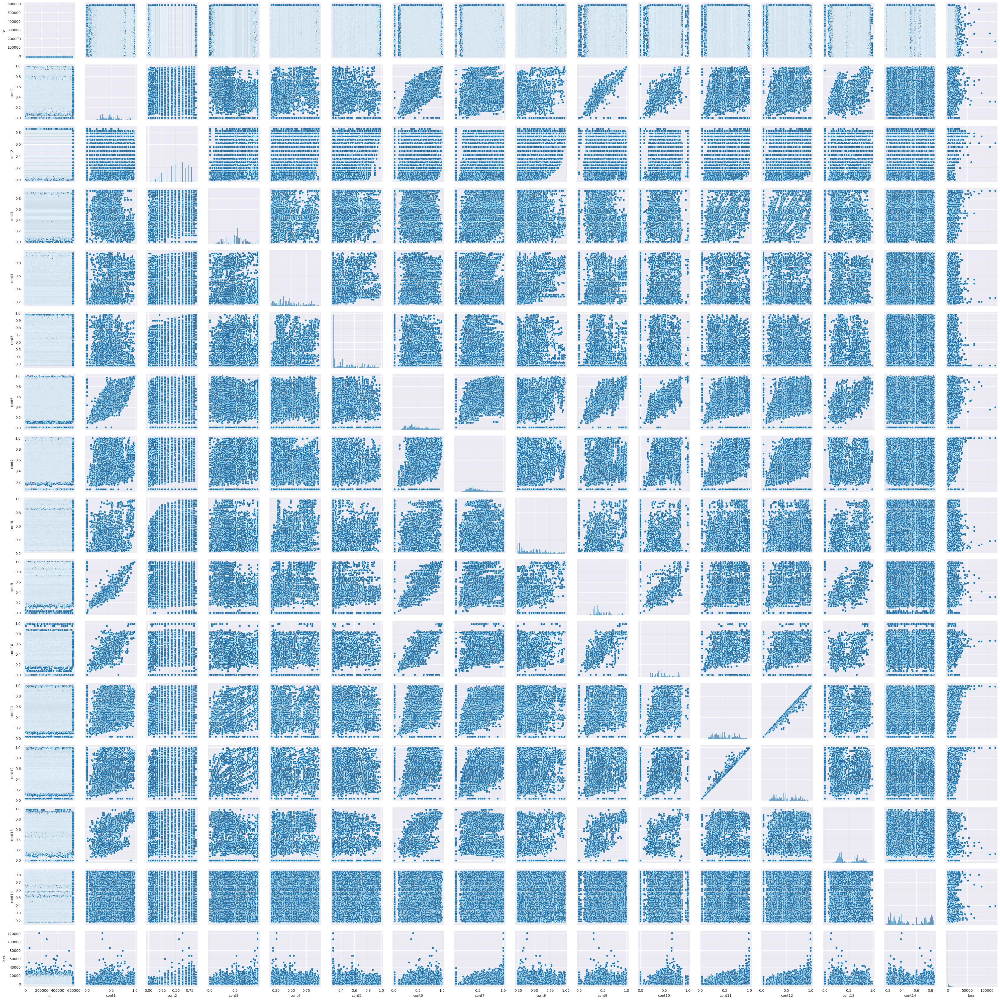

In [11]:
sns.pairplot(data=loss_amount, height=2.5);
plt.tight_layout()

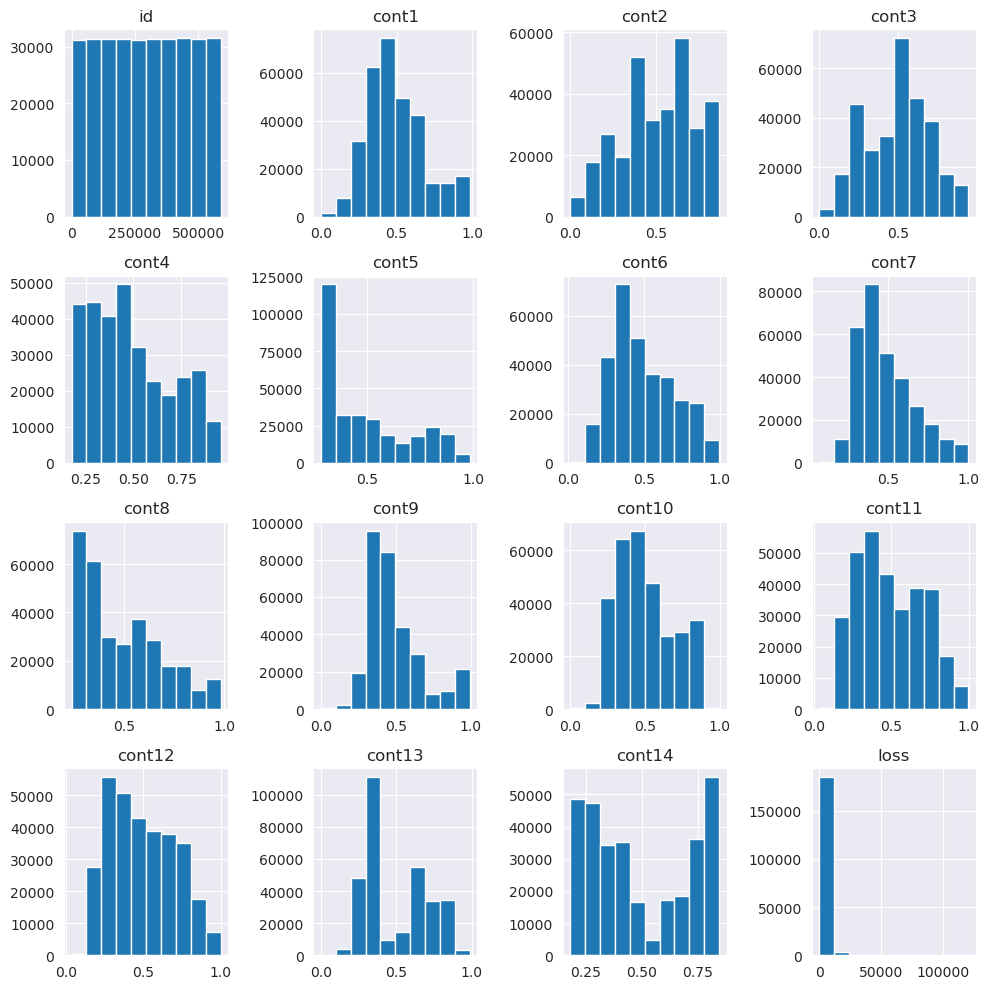

In [12]:
loss_amount.hist(figsize=(10, 10), bins=10);
plt.tight_layout()

# 2. Data preprocessing

## 2.x. Data Manipulation

In [13]:
import regex as re

In [14]:
cat_pattern = re.compile('^cat(\d{1,3})$')

In [15]:
cat_cols = [col for col in loss_amount.columns if cat_pattern.match(col)]

In [16]:
len(cat_cols)

116

In [17]:
cat_cols_index = [loss_amount.columns.tolist().index(cat_col) for cat_col in cat_cols]

## 2.xx. Data Transformation

In [18]:
X = loss_amount.iloc[:, :-1]
y = loss_amount.iloc[:, -1]

In [19]:
counts = X.select_dtypes(include='object').nunique().sum()
cols_name = range(0, counts)

In [20]:
numeric_df = X.select_dtypes(include='float')
for col in cat_cols:
    le = LabelEncoder()
    X[col] = le.fit_transform(X[col])

ct = ColumnTransformer(transformers=[(col, OneHotEncoder(), cat_cols_index)], remainder='drop')
cat_arr = ct.fit_transform(X).todense()
cat_df = pd.DataFrame(cat_arr, columns=cols_name)
X = pd.merge(left=cat_df, right=numeric_df, left_index=True, right_index=True, how='outer')

In [22]:
h5_X = File('models/Loss Amount Prediction/X.h5', mode='w')
h5_X.create_dataset(name='features', data=X.values)
h5_X.close()

In [23]:
loss_amount.shape

(313864, 132)

In [25]:
y = np.log(y)

/opt/conda/lib/python3.10/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


In [26]:
type(y)

pandas.core.series.Series

## 2.xxx. Data visualization

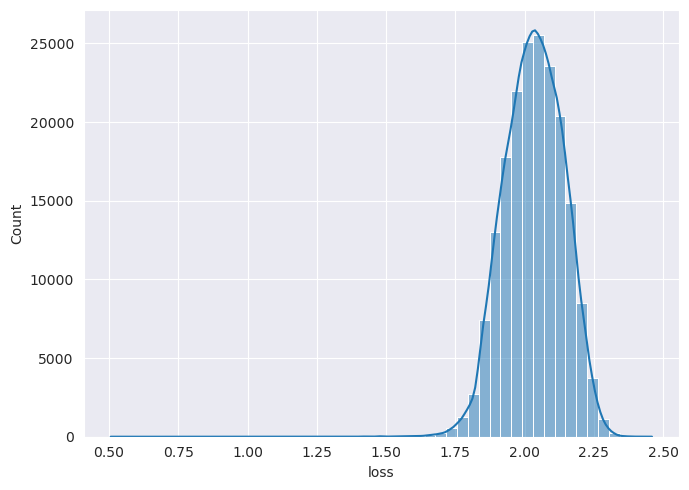

In [27]:
plt.figure(figsize=(7, 5))
sns.histplot(data=y, kde=True, bins=50)
plt.tight_layout()

# 3. Data Modeling

In [28]:
X = csr_matrix(np.asarray(X))
X

<313864x1190 sparse matrix of type '<class 'numpy.float64'>'
	with 40801954 stored elements in Compressed Sparse Row format>

In [29]:
feature_train, label_train = X[:188318, :], y[:188318]
feature_test, label_test = X[188318:, :], y[188318:]

In [30]:
X_train, X_test, y_train, y_test = train_test_split(feature_train, label_train, random_state=0)

In [31]:
cat_reg = CatBoostRegressor(n_estimators=1000, max_depth=3, loss_function='RMSE', eval_metric='MAE',
                           colsample_bylevel=.8, subsample=1, random_seed=0, eta=.01, l2_leaf_reg=.01)

In [44]:
y_train.isna().sum()

1

In [46]:
y_train = y_train.fillna(y_train.mean())

In [47]:
y_train.isna().sum()

0

In [48]:
cat_reg.fit(X=X_train, y=y_train, eval_set=(X_test, y_test))

0:	learn: 0.0861693	test: 0.0854809	best: 0.0854809 (0)	total: 103ms	remaining: 1m 42s
1:	learn: 0.0859044	test: 0.0852188	best: 0.0852188 (1)	total: 142ms	remaining: 1m 10s
2:	learn: 0.0856458	test: 0.0849629	best: 0.0849629 (2)	total: 184ms	remaining: 1m 1s
3:	learn: 0.0853930	test: 0.0847127	best: 0.0847127 (3)	total: 230ms	remaining: 57.3s
4:	learn: 0.0851465	test: 0.0844691	best: 0.0844691 (4)	total: 270ms	remaining: 53.7s
5:	learn: 0.0849109	test: 0.0842381	best: 0.0842381 (5)	total: 320ms	remaining: 53s
6:	learn: 0.0846676	test: 0.0839976	best: 0.0839976 (6)	total: 360ms	remaining: 51s
7:	learn: 0.0844399	test: 0.0837706	best: 0.0837706 (7)	total: 400ms	remaining: 49.6s
8:	learn: 0.0842039	test: 0.0835372	best: 0.0835372 (8)	total: 440ms	remaining: 48.5s
9:	learn: 0.0839721	test: 0.0833078	best: 0.0833078 (9)	total: 479ms	remaining: 47.4s
10:	learn: 0.0837435	test: 0.0830821	best: 0.0830821 (10)	total: 519ms	remaining: 46.6s
11:	learn: 0.0835164	test: 0.0828582	best: 0.0828582 (

# 4. Data Evaluation

In [49]:
print('mean : {}'.format(np.mean(np.exp(y))))
print('std : {}'.format(np.std(np.exp(y))))

mean : 7.685310779734537
std : 0.8116542514944411


In [50]:
actual = np.exp(y_test)
predicted = np.exp(cat_reg.predict(X_test))

In [51]:
print('MAE : {}'.format(mean_absolute_error(y_true=actual, y_pred=predicted)))
print('MSE : {}'.format(mean_squared_error(y_true=actual, y_pred=predicted)))

MAE : 0.45423221947248177
MSE : 0.33598954865435215


In [52]:
print('R-Squared (Training) : {}'.format(r2_score(y_true=np.exp(y_train), y_pred=np.exp(cat_reg.predict(X_train)))))
print('R-Squared (Test) : {}'.format(r2_score(y_true=actual, y_pred=predicted)))

R-Squared (Training) : 0.4912813042671291
R-Squared (Test) : 0.4854073301570524


## 5. Create the Final model

In [ ]:
cat_reg = CatBoostRegressor(n_estimators=55390, max_depth=3, loss_function='RMSE', eval_metric='MAE',
                           colsample_bylevel=.8, subsample=1, random_seed=0, eta=.01, l2_leaf_reg=.01)

In [54]:
label_train.isna().sum()

1

In [56]:
label_train = label_train.fillna(label_train.mean())

In [57]:
label_train.isna().sum()

0

In [ ]:
cat_reg.fit(X=feature_train, y=label_train)

0:	learn: 0.0859943	total: 35.5ms	remaining: 32m 44s
1:	learn: 0.0857326	total: 72.6ms	remaining: 33m 29s
2:	learn: 0.0854729	total: 109ms	remaining: 33m 25s
3:	learn: 0.0852177	total: 144ms	remaining: 33m 15s
4:	learn: 0.0849664	total: 180ms	remaining: 33m 10s
5:	learn: 0.0847296	total: 217ms	remaining: 33m 18s
6:	learn: 0.0844886	total: 254ms	remaining: 33m 32s
7:	learn: 0.0842614	total: 291ms	remaining: 33m 33s
8:	learn: 0.0840266	total: 328ms	remaining: 33m 38s
9:	learn: 0.0837937	total: 365ms	remaining: 33m 39s
10:	learn: 0.0835790	total: 403ms	remaining: 33m 50s
11:	learn: 0.0833622	total: 441ms	remaining: 33m 56s
12:	learn: 0.0831417	total: 479ms	remaining: 34m 1s
13:	learn: 0.0829285	total: 517ms	remaining: 34m 5s
14:	learn: 0.0827128	total: 554ms	remaining: 34m 5s
15:	learn: 0.0825012	total: 593ms	remaining: 34m 12s
16:	learn: 0.0822931	total: 630ms	remaining: 34m 12s
17:	learn: 0.0820911	total: 667ms	remaining: 34m 11s
18:	learn: 0.0818895	total: 707ms	remaining: 34m 21s
19:	

In [59]:
with open('models/Loss Amount Prediction/cat_reg.cbm', 'wb') as f:
    dump(cat_reg, f)

## 6. Predicting Labels for test dataset

In [60]:
loss_amount_test['loss'] = np.exp(cat_reg.predict(feature_test))

In [61]:
loss_amount_test.loss

0         7.236904
1         7.577444
2         9.208570
3         8.753412
4         6.760260
            ...   
125541    7.604302
125542    7.964439
125543    7.823623
125544    6.821579
125545    7.967176
Name: loss, Length: 125546, dtype: float64

In [62]:
loss_amount_test[['id', 'loss']].to_csv('datasets/Allstate Claims Severity/Allstate Claims Severity.csv', index_label=False)